# Team College MMAI 891 Project - Finance Section
### Team College Objectives:
Data Preprocessing: Team College aim to build Custom Functions for Preprocessing and Feature Engineering to achieve accuracy excellence
Experimentation _ Model Architecture: Team College aim to develop the best model that is able to train with high accuracy and without any errors. To achieve the goal, Team College love to tryout different methodologies in text classification: (can be changed in here after we have a concrete result)

1. Shallow ML-based: Word Enbedding (TF-IDF) + Boosting (SVM, DT, RF, Boosting...)(Shuyi)

2. Deep Learning: Sentence Embedding (word2vec,BERT) + Deep NN(such as CNN, RNN, LSTM, GRU, Transformer...)
Transfer learning: Few-shot, zero-shot (Deepali + Jiayu)
Pipeline building in Deep Learning (Andrew)
3. Hybrid: Sentence Embedding (word2vec,BERT) + Boosting (KNN, RF, LGBM, XGBoost)
(Mangesh trying word2Vec + Boosting)
(Wesley trying BERT + Boosting)

Best Performing Model: Further Development and Tryouts such as Parameter Tuning, Learning Rate and tansfer learning method will be applied to design the best performing Model.

# Housekeeping Setup
## Prerequisite: install and import libraries

In [1]:
pip install catboost

     |████████████████████████████████| 76.6 MB 1.3 MB/s 


In [2]:
pip install transformers

     |████████████████████████████████| 4.0 MB 4.1 MB/s 
     |████████████████████████████████| 596 kB 67.0 MB/s 
     |████████████████████████████████| 77 kB 7.5 MB/s 
     |████████████████████████████████| 895 kB 64.5 MB/s 
     |████████████████████████████████| 6.6 MB 64.6 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [3]:
pip install sentence_transformers

     |████████████████████████████████| 79 kB 3.3 MB/s 
     |████████████████████████████████| 1.2 MB 12.1 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.0-py3-none-any.whl size=120747 sha256=d932ac0358b8a2407eb7a1a002ed48c520cd4e31b64acec26b652300bf1eab09
  Stored in directory: /root/.cache/pip/wheels/83/c0/df/b6873ab7aac3f2465aa9144b6b4c41c4391cfecc027c8b07e7
Successfully built sentence-transformers


In [4]:
pip install optuna

     |████████████████████████████████| 308 kB 4.0 MB/s 
     |████████████████████████████████| 210 kB 70.3 MB/s 
     |████████████████████████████████| 81 kB 11.0 MB/s 
     |████████████████████████████████| 78 kB 8.7 MB/s 
     |████████████████████████████████| 113 kB 61.3 MB/s 
     |████████████████████████████████| 49 kB 7.6 MB/s 
     |████████████████████████████████| 146 kB 44.5 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=0f9e1da61be488070af542f3f4e78379b4a5a507603aab001b9e087465217464
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [5]:
pip install shap

     |████████████████████████████████| 564 kB 4.2 MB/s 


In [32]:
!pip install ktrain

In [7]:
pip install unidecode

     |████████████████████████████████| 235 kB 4.3 MB/s 


In [8]:
pip install textstat

     |████████████████████████████████| 105 kB 4.4 MB/s 
     |████████████████████████████████| 2.0 MB 25.1 MB/s 


In [30]:
import os
import string
import re
import abc
import cv2
import datetime
import torch
import numpy as np 
import pandas as pd
from pandas_profiling import ProfileReport
from tqdm import tqdm
from matplotlib import style
style.use('default')
import seaborn as sns 
import matplotlib
import matplotlib.pyplot as plt
from statistics import mean

import nltk
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')
import unidecode
import textstat
import unicodedata
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem.porter import PorterStemmer
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.tokenize import sent_tokenize
from bs4 import BeautifulSoup
from gensim.models import Word2Vec, FastText
from sklearn.decomposition import PCA
import plotly.graph_objects as go

import tensorflow as tf
import tensorflow.keras as keras
import ktrain
from ktrain import text

from transformers import AutoModel, BertTokenizerFast, DistilBertTokenizer, TFDistilBertModel, DistilBertModel
import transformers
from sentence_transformers import SentenceTransformer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Dense, Input, Dropout, GlobalMaxPooling1D
from keras.layers import Conv1D, MaxPooling1D, Embedding, LSTM
from keras.models import Model

from sklearn.utils import shuffle
from tensorflow.keras import regularizers
from transformers import BertTokenizer, TFBertModel, BertConfig

from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder, FunctionTransformer, MinMaxScaler
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
# from sklearn.feature_extraction import stop_words
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
import optuna
import shap
import lightgbm as lgb
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, KFold, cross_val_predict, cross_val_score, StratifiedKFold
from sklearn.decomposition import NMF
from sklearn.metrics.cluster import adjusted_rand_score, adjusted_mutual_info_score

from sklearn.neural_network import MLPClassifier
from catboost import CatBoostClassifier, Pool

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = 'true'
os.environ["TOKENIZERS_PARALLELISM"] = "true"
os.environ['CUDA_DEVICE_ORDER'] = "PCI_BUS_ID"; 
os.environ['CUDA_VISIBLE_DEVICES'] = "0"

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [10]:
!nvidia-smi

Fri Apr 15 15:24:05 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. EDA

In [12]:
train=pd.read_csv('/content/drive/MyDrive/public_data.csv', index_col='id')

In [13]:
train.shape

(10466, 2)

In [14]:
train.head()

,message,label
id,,
5396,I made a purchase recently but I have decided ...,request_refund
2202,"Cancel my transfer, please.",cancel_transfer
3768,How do I change my last name?,edit_personal_details
4967,A withdraw I tried to make at the ATM was decl...,declined_cash_withdrawal
5622,I tried to buy something online yesterday and ...,declined_transfer


### 1.1 Label

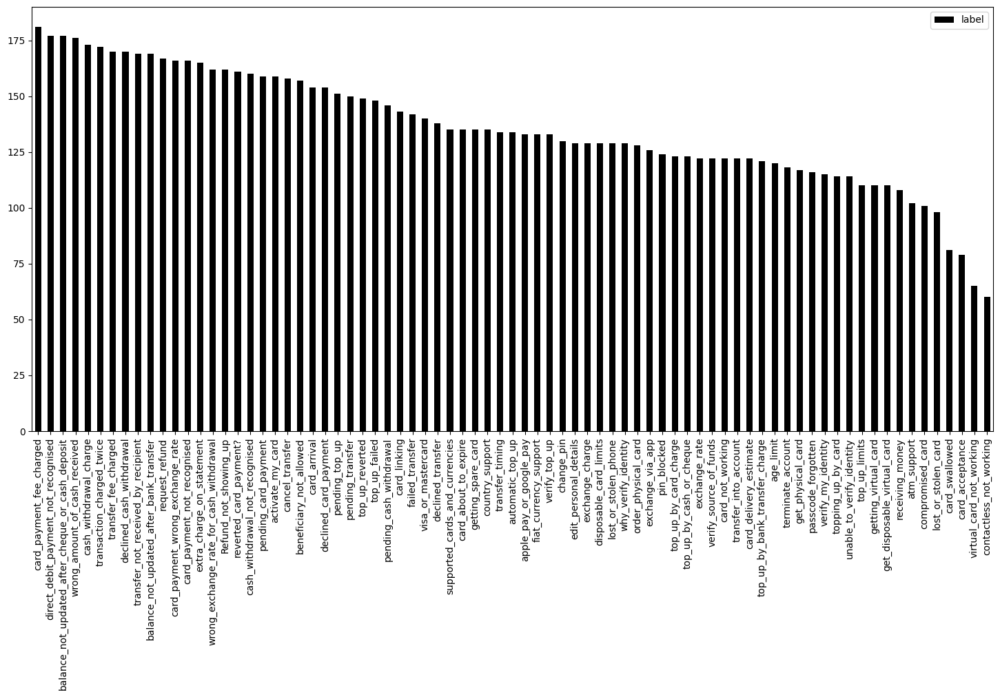

In [ ]:
pd.DataFrame(train['label'].value_counts()).plot(kind='bar', figsize=(18, 8), color='k')

### 1.2 Corpus

In [ ]:
from gensim.models import Word2Vec, FastText
from gensim.test.utils import common_texts
from sklearn.decomposition import PCA
import plotly.graph_objects as go

corpus = []
for col in train.message:
   word_list = col.split(" ")
   corpus.append(word_list)

#show first value
corpus[0:1]

#generate vectors from corpus
model = Word2Vec(corpus, min_count=1, size = 56)


#pass the embeddings to PCA
X = model[model.wv.vocab] 
pca = PCA(n_components=2)
result = pca.fit_transform(X)

#create df from the pca results
pca_df = pd.DataFrame(result, columns = ['x','y'])

N = 1000000
words = list(model.wv.vocab)

#add the words for the hover effect
pca_df['word'] = words
pca_df.head()

fig = go.Figure(data=go.Scattergl(
   x = pca_df['x'],
   y = pca_df['y'],
   mode='markers',
   marker=dict(
       color=np.random.randn(N),
       colorscale='Viridis',
       line_width=1
   ),
   text=pca_df['word'],
   textposition="bottom center"
))

fig.show()

[['I',
  'made',
  'a',
  'purchase',
  'recently',
  'but',
  'I',
  'have',
  'decided',
  'that',
  "I'm",
  'not',
  'buying',
  'it',
  'and',
  'I',
  'need',
  'to',
  'receive',
  'my',
  'money',
  'back.',
  'Can',
  'you',
  'please',
  'give',
  'me',
  'a',
  'refund',
  'ASAP.',
  "It's",
  'extremely',
  'urgent.']]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



,x,y,word
0,3.637682,0.637970,I
1,3.417485,-2.274760,made
2,3.869418,-1.003373,a
3,2.613502,-0.927949,purchase
4,1.174125,-0.363430,recently


# 2. Modeling:

## 2.1. Shallow NLP -- Word Enbedding (TF-IDF) + Boosting (SVM, DT, RF, Boosting...)


In [ ]:
X = train['message']
y = train['label']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(8372,)
(8372,)
(2094,)
(2094,)


In [ ]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
import unidecode
import textstat
import string  

lemmer = WordNetLemmatizer()

# Simple preprocessor.

def my_preprocess(doc):
    
    # Lowercase
    doc = doc.lower()
    
    # Replace URL with URL string
    doc = re.sub(r'http\S+', 'URL', doc)
    
    # Remove punctuation
    doc = re.sub(r'[^\w\s]', '', doc)
    
    # Replace AT with AT string
    doc = re.sub(r'@', 'AT', doc)
    
    # Replace all numbers/digits with the string NUM
    doc = re.sub(r'\b\d+\b', 'NUM', doc)
    
    # Remove numbers
    doc = re.sub(r'\d+', '', doc)
    
    # Lemmatize each word.
    doc = ' '.join([lemmer.lemmatize(w) for w in doc.split()])

    return doc

In [ ]:
# These functions will calculate additional features on the document.
# They will be put into the Pipeline, called via the FunctionTransformer() function.
# Each one takes an entier corpus (as a list of documents), and should return
# an array of feature values (one for each document in the corpus).
# These functions can do anything they want; I've made most of them quick
# one-liners Hopefully the names of the functions will make them self explanitory.

def doc_length(corpus):
    return np.array([len(doc) for doc in corpus]).reshape(-1, 1)

def lexicon_count(corpus):
    return np.array([textstat.lexicon_count(doc) for doc in corpus]).reshape(-1, 1)

def _get_punc(doc):
    return len([a for a in doc if a in string.punctuation])

def punc_count(corpus):
    return np.array([_get_punc(doc) for doc in corpus]).reshape(-1, 1)

def _get_caps(doc):
    return sum([1 for a in doc if a.isupper()])

def capital_count(corpus):
    return np.array([_get_caps(doc) for doc in corpus]).reshape(-1, 1)

# See if the document ends with something like "Love Steve XXX"
def has_lovexxx(corpus):
    return np.array([bool(re.search(r"l[ou]+ve?.{0,10}x{2,5}\.? ?$", doc.lower())) for doc in corpus]).reshape(-1, 1)
##this might be useful

def has_money(corpus):
    return np.array([bool(re.search("[\$£]|\bpence\b|\bdollar\b", doc.lower())) for doc in corpus]).reshape(-1, 1)
##this might be useful

def has_sexy_phrase(corpus):
    return np.array([bool(re.search("sexy single|\bfree sexy\b|\bsexy pic\b|\blive sex\b", doc.lower())) for doc in corpus]).reshape(-1, 1)

In [ ]:
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
# from sklearn.feature_extraction import stop_words
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import FunctionTransformer
from sklearn.decomposition import NMF
from sklearn.neural_network import MLPClassifier

# Need to preprocess the stopwords, because scikit learn's TfidfVectorizer
# removes stopwords _after_ preprocessing
stop_words = [my_preprocess(word) for word in stopwords.words('english')]
# This vectorizer will be used to create the BOW features
vectorizer = TfidfVectorizer(preprocessor=my_preprocess, 
                             max_features = 1000, 
                             ngram_range=[1,4],
                             stop_words=None,
                             strip_accents="unicode", 
                             lowercase=False, max_df=0.25, min_df=0.001, use_idf=True)

# This vectorizer will be used to preprocess the text before topic modeling.
# (I _could_ use the same vectorizer as above- but why limit myself?)
vectorizer2 = TfidfVectorizer(preprocessor=my_preprocess, 
                             max_features = 1000, 
                             ngram_range=[1,2],
                             stop_words=None,
                             strip_accents="unicode", 
                             lowercase=False, max_df=0.25, min_df=0.001, use_idf=True)

nmf = NMF(n_components=25, random_state=1, init='nndsvda', solver='mu', alpha=.1, l1_ratio=.5)
rf = RandomForestClassifier(criterion='entropy', random_state=223)
mlp = MLPClassifier(random_state=42, verbose=2, max_iter=200)



feature_processing =  FeatureUnion([ 
    ('bow', Pipeline([('cv', vectorizer), ])),
    ('topics', Pipeline([('cv', vectorizer2), ('nmf', nmf),])),
    ('length', FunctionTransformer(doc_length, validate=False)),
    ('words', FunctionTransformer(lexicon_count, validate=False)),
    ('punc_count', FunctionTransformer(punc_count, validate=False)),
    ('capital_count', FunctionTransformer(capital_count, validate=False)),   
    ('has_lovexxx', FunctionTransformer(has_lovexxx, validate=False)),    
    ('has_money', FunctionTransformer(has_money, validate=False)),
    ('has_sexy_phrase', FunctionTransformer(has_sexy_phrase, validate=False)),
])

steps = [('features', feature_processing)]

pipe = Pipeline([('features', feature_processing), ('clf', mlp)])

param_grid = {}

# You - yes you! Manually choose which classifier run you'd like to tryout latter.
# You can set this to either:
#
# "RF" - Random Forest
# "MLP" - NN
# or something else!
#
# and then re-run the entire notebook
which_clf = "RF"

if which_clf == "RF":

    steps.append(('clf', rf))

    param_grid = {
        'features__bow__cv__preprocessor': [None, my_preprocess],
        'features__bow__cv__max_features': [200, 500, 1000],
        'features__bow__cv__use_idf': [False],
        'features__topics__cv__stop_words': [None],
        'features__topics__nmf__n_components': [25, 75],
        'clf__n_estimators': [100, 500],
        'clf__class_weight': [None],
    }
    
elif which_clf == "MLP":
    
    steps.append(('clf', mlp))
    param_grid = {
        'features__bow__cv__preprocessor': [my_preprocess],
        'features__bow__cv__max_features': [1000, 3000],
        'features__bow__cv__min_df': [0],
        'features__bow__cv__use_idf': [False],
        'features__topics__nmf__n_components': [300],
        'clf__hidden_layer_sizes': [(100, ), (50, 50), (25, 25, 25)],
    }

pipe = Pipeline(steps)

search = GridSearchCV(pipe, param_grid, cv=5, n_jobs=3, scoring='f1_macro', return_train_score=True, verbose=2)

In [ ]:
search = search.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning:

`alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead



In [ ]:
print("Best parameter (CV scy_train%0.3f):" % search.best_score_)
print(search.best_params_)

Best parameter (CV scy_train0.787):
{'clf__class_weight': None, 'clf__n_estimators': 500, 'features__bow__cv__max_features': 1000, 'features__bow__cv__preprocessor': None, 'features__bow__cv__use_idf': False, 'features__topics__cv__stop_words': None, 'features__topics__nmf__n_components': 75}


In [ ]:
pred_val = search.predict(X_val)
print(confusion_matrix(y_val, pred_val))
print(classification_report(y_val, pred_val))

ari = adjusted_rand_score(y_val, pred_val)
ami = adjusted_mutual_info_score(y_val, pred_val, average_method='arithmetic')

print("ARI: {}".format(ari))
print("AMI: {}".format(ami))

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning:

`alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead



[[25  0  0 ...  0  0  0]
 [ 0 20  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 23  0]
 [ 0  0  0 ...  0  2 18]]
                                                  precision    recall  f1-score   support

                           Refund_not_showing_up       0.76      0.93      0.83        27
                                activate_my_card       0.61      0.77      0.68        26
                                       age_limit       0.81      0.96      0.88        26
                         apple_pay_or_google_pay       0.96      1.00      0.98        27
                                     atm_support       0.94      1.00      0.97        16
                                automatic_top_up       0.96      0.87      0.92        31
         balance_not_updated_after_bank_transfer       0.69      0.61      0.65        36
balance_not_updated_after_cheque_or_cash_deposit       0.77      0.88      0.82        34
                         benefici

## 2.2 Deep Learning NLP:

2.2.1 Sentence Embedding (word2vec,BERT) + Deep NN(such as CNN, RNN, LSTM, GRU, Transformer...)

Word2Vector model

In [15]:
df = pd.read_csv('/content/drive/MyDrive/public_data.csv')
print(df.info())
df = df.drop('id', axis=1)
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10466 entries, 0 to 10465
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       10466 non-null  int64 
 1   message  10466 non-null  object
 2   label    10466 non-null  object
dtypes: int64(1), object(2)
memory usage: 245.4+ KB
None


,message,label
0,I made a purchase recently but I have decided ...,request_refund
1,"Cancel my transfer, please.",cancel_transfer
2,How do I change my last name?,edit_personal_details
3,A withdraw I tried to make at the ATM was decl...,declined_cash_withdrawal
4,I tried to buy something online yesterday and ...,declined_transfer


In [16]:
class Word2VecModel():
    def __init__(self, train_df):
        self.df = train_df
        X = train_df['message']
        y = pd.get_dummies(train_df.astype(str),columns=['label'], prefix='', prefix_sep='').drop('message', axis=1)
        self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(X, y, test_size=0.2, random_state=42)
        self.MAX_VOCAB_SIZE = 4096
        self.EMBEDDING_DIM=100
        self.MAX_SEQUENCE_LENGTH= 100
        self.VALIDATION_SPLIT =0.2
        self.BATCH_SIZE =128
        self.EPOCHS =10
        self.model = ''

    
    def create_tokenizer(self, x, y ):
        sentences = x.values
        possible_labels = y.columns
        targets = y.values
        tokenizer= Tokenizer(num_words=self.MAX_VOCAB_SIZE)
        tokenizer.fit_on_texts(sentences)
        sequences = tokenizer.texts_to_sequences(sentences)
        data = pad_sequences(sequences, maxlen=self.MAX_SEQUENCE_LENGTH)
        print("max sequence length:", max(len(s) for s in sequences))
        print("min sequence length:", min(len(s) for s in sequences))
        s = sorted(len(s) for s in sequences)
        print("median sequence length:", s[len(s) // 2])
        print("max word index:", max(max(seq) for seq in sequences if len(seq) > 0))
        word2idx = tokenizer.word_index
        print('Found %s unique tokens.' % len(word2idx))
        return word2idx, data, targets, possible_labels
        
    def load_embedding(self):
        word2vec = {}
        with open(os.path.join('glove.6B.100d.txt')) as f:
            for line in f:
                values = line.split()
                word = values[0]
                vec = np.asarray(values[1:], dtype='float32')
                word2vec[word] = vec
        print('Found %s word vectors.' % len(word2vec))
        return word2vec
    
        
    def embedding_data(self, word2idx, word2vec):
        num_words = min(self.MAX_VOCAB_SIZE, len(word2idx) + 1)
        embedding_matrix = np.zeros((num_words, self.EMBEDDING_DIM))
        for word, i in word2idx.items():
            if i < self.MAX_VOCAB_SIZE:
                embedding_vector = word2vec.get(word)
                if embedding_vector is not None:
                    embedding_matrix[i] = embedding_vector
        return num_words, embedding_matrix
                    
    def create_model(self, num_words, possible_labels, embedding_matrix):
        embedding_layer = Embedding(
            num_words,
            self.EMBEDDING_DIM,
            weights=[embedding_matrix],
            input_length=self.MAX_SEQUENCE_LENGTH,
            trainable=False
        )
        
        input_ = Input(shape=(self.MAX_SEQUENCE_LENGTH,))
        x=embedding_layer(input_)
        x=Conv1D(128,3,activation="relu")(x)
        x=GlobalMaxPooling1D()(x)
        x=Dense(128,activation="relu")(x)
        output = Dense(len(possible_labels), activation='sigmoid')(x)

        self.model = Model(input_, output)
        self.model.compile(
          loss='binary_crossentropy',
          optimizer='rmsprop',
          metrics=['accuracy']
        )
    
    def train_model(self, data, targets):
        print('Training model...')
        r = self.model.fit(
          data,
          targets,
          batch_size=self.BATCH_SIZE,
          epochs=self.EPOCHS,
          validation_split=self.VALIDATION_SPLIT
        )
        return self.model
        
    def run(self):
        word2idx, data, targets, possible_labels = self.create_tokenizer(self.X_train, self.y_train)
        word2vec = self.load_embedding()
        num_words, embedding_matrix = self.embedding_data(word2idx, word2vec)
        self.create_model(num_words, possible_labels, embedding_matrix)
        self.train_model(data, targets)
        return self.model
    
    def eval_model(self):
        word2idx, data, targets, possible_labels = self.create_tokenizer(self.X_train, self.y_train)
        pred_val = self.model.predict(data)
        ari = adjusted_rand_score(self.y_val, pred_val)
        ami = adjusted_mutual_info_score(self.y_val, pred_val, average_method='arithmetic')

        print("ARI: {}".format(ari))
        print("AMI: {}".format(ami))

In [17]:
word2vec_model = Word2VecModel(df)
model = word2vec_model.run()

max sequence length: 76 min sequence length: 2 median sequence length: 10 max word index: 2203 Found 2203 unique tokens. Found 400000 word vectors. Training model... Epoch 1/10 53/53 [==============================] - 3s 42ms/step - loss: 0.1126 - accuracy: 0.0288 - val_loss: 0.0688 - val_accuracy: 0.0585 Epoch 2/10 53/53 [==============================] - 2s 34ms/step - loss: 0.0618 - accuracy: 0.1643 - val_loss: 0.0581 - val_accuracy: 0.2161 Epoch 3/10 53/53 [==============================] - 2s 36ms/step - loss: 0.0487 - accuracy: 0.3985 - val_loss: 0.0449 - val_accuracy: 0.4006 Epoch 4/10 53/53 [==============================] - 2s 36ms/step - loss: 0.0375 - accuracy: 0.5617 - val_loss: 0.0369 - val_accuracy: 0.5110 Epoch 5/10 53/53 [==============================] - 2s 33ms/step - loss: 0.0306 - accuracy: 0.6551 - val_loss: 0.0319 - val_accuracy: 0.5869 Epoch 6/10 25/53 [=============>................] - ETA: 0s - loss: 0.0269 - accuracy: 0.7097

2.2.2 Transfer learning: Few-shot, zero-shot + Pipeline building in Deep Learning

Distillbert with ktrain learner

In [18]:
X = df['message']
y = df['label']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state = 42)

print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(8372,)
(8372,)
(2094,)
(2094,)


In [19]:
model_name = 'distilbert-base-uncased'

classes = y.unique().tolist()
#model = DistilBertModel.from_pretrained("distilbert-base-uncased")
trans = text.Transformer(model_name,maxlen=512, class_names=classes)

train_data = trans.preprocess_train(np.array(X_train), np.array(y_train))
valiation_data = trans.preprocess_train(np.array(X_val), np.array(y_val))

Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

preprocessing train...
language: en
train sequence lengths:
	mean : 12
	95percentile : 28
	99percentile : 42


class_names argument was ignored, as they were extracted from string labels in dataset


Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Is Multi-Label? False
preprocessing train...
language: en
train sequence lengths:
	mean : 12
	95percentile : 29
	99percentile : 40


Is Multi-Label? False


In [33]:
model = trans.get_classifier()
learner = ktrain.get_learner(model, train_data = train_data, val_data = valiation_data, batch_size = 16)
learner.lr_find( start_lr=1e-07,
    lr_mult=1.01,
    max_epochs=10,
    class_weight=None,
    stop_factor=4,
    show_plot=True,
    suggest=True,
    restore_weights_only=False,
    verbose=1,)

simulating training for different learning rates... this may take a few moments...
Epoch 1/10
523/523 [==============================] - 477s 891ms/step - loss: 4.3452 - accuracy: 0.0148
Epoch 2/10
523/523 [==============================] - 472s 904ms/step - loss: 4.3055 - accuracy: 0.0369
Epoch 3/10
523/523 [==============================] - 472s 903ms/step - loss: 3.3697 - accuracy: 0.4434
Epoch 4/10
523/523 [==============================] - 472s 902ms/step - loss: 1.0391 - accuracy: 0.7992
Epoch 5/10
523/523 [==============================] - 472s 902ms/step - loss: 2.5533 - accuracy: 0.3808
Epoch 6/10
523/523 [==============================] - 20s 36ms/step - loss: 4.3621 - accuracy: 0.0093


done.
Visually inspect loss plot and select learning rate associated with falling loss
Three possible suggestions for LR from plot:
	Longest valley (red): 1.22E-05
	Min numerical gradient (purple): 2.24E-05
	Min loss divided by 10 (omitted from plot): 2.48E-05


In [21]:
learner.fit_onecycle(lr=2.36E-05,epochs=10)



begin training using onecycle policy with max lr of 2.36e-05...
Epoch 1/10
524/524 [==============================] - 526s 985ms/step - loss: 4.1959 - accuracy: 0.1248 - val_loss: 3.7763 - val_accuracy: 0.4140
Epoch 2/10
524/524 [==============================] - 515s 981ms/step - loss: 3.1935 - accuracy: 0.5199 - val_loss: 2.4296 - val_accuracy: 0.6476
Epoch 3/10
524/524 [==============================] - 515s 980ms/step - loss: 1.8148 - accuracy: 0.7365 - val_loss: 1.1656 - val_accuracy: 0.8252
Epoch 4/10
524/524 [==============================] - 515s 981ms/step - loss: 0.8129 - accuracy: 0.8847 - val_loss: 0.6151 - val_accuracy: 0.8629
Epoch 5/10
524/524 [==============================] - 515s 981ms/step - loss: 0.3838 - accuracy: 0.9356 - val_loss: 0.4442 - val_accuracy: 0.8935
Epoch 6/10
524/524 [==============================] - 515s 980ms/step - loss: 0.1994 - accuracy: 0.9627 - val_loss: 0.4097 - val_accuracy: 0.9002
Epoch 7/10
524/524 [==============================] - 515s

In [22]:
learner.validate(class_names=classes)

                                                  precision    recall  f1-score   support

                                  request_refund       0.96      0.89      0.92        27
                                 cancel_transfer       1.00      0.96      0.98        26
                           edit_personal_details       1.00      1.00      1.00        26
                        declined_cash_withdrawal       1.00      0.96      0.98        27
                               declined_transfer       1.00      1.00      1.00        16
                                   verify_top_up       1.00      0.97      0.98        31
         balance_not_updated_after_bank_transfer       0.79      0.86      0.83        36
                          disposable_card_limits       1.00      0.91      0.95        34
                       transaction_charged_twice       0.77      0.95      0.85        21
                          card_delivery_estimate       0.97      1.00      0.99        38
         

array([[24,  0,  0, ...,  0,  0,  0],
       [ 0, 25,  0, ...,  0,  0,  0],
       [ 0,  0, 26, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ..., 17,  0,  0],
       [ 0,  0,  0, ...,  0, 25,  0],
       [ 0,  0,  0, ...,  0,  0, 26]])

In [23]:
learner.view_top_losses(n = 10, preproc = trans)

----------
id:815 | loss:8.64 | true:pin_blocked | pred:card_not_working)

----------
id:384 | loss:8.25 | true:cash_withdrawal_charge | pred:cash_withdrawal_not_recognised)

----------
id:208 | loss:8.0 | true:declined_cash_withdrawal | pred:card_not_working)

----------
id:1809 | loss:7.82 | true:card_not_working | pred:pin_blocked)

----------
id:1733 | loss:7.7 | true:get_disposable_virtual_card | pred:compromised_card)

----------
id:1141 | loss:7.44 | true:failed_transfer | pred:order_physical_card)

----------
id:1483 | loss:7.43 | true:unable_to_verify_identity | pred:verify_my_identity)

----------
id:564 | loss:7.41 | true:transfer_into_account | pred:top_up_reverted)

----------
id:1033 | loss:7.23 | true:verify_my_identity | pred:compromised_card)

----------
id:1231 | loss:7.17 | true:contactless_not_working | pred:order_physical_card)



In [25]:
predictor = ktrain.get_predictor(learner.model, preproc=trans)

TFDistilBertModel

In [27]:
# class MetaService(type):
#     def __new__(cls, name:str, bases, namespace, **kwargs):
#         home = os.environ.get('HOME')
#         if not name.startswith('Srv'):
#             raise TypeError('[Fatal] Invalid service statement')
#         elif not home.endswith('Jiayu'):
#             raise TypeError('[Fatal] Invalid device')
#         return super().__new__(cls, name, bases, namespace, **kwargs)
    

class SrvModelTrainer():
# (metaclass=MetaService):
    def __init__(self, data, batch_size, epochs):
        self.data = data
        self.max_len = 32
        self.batch_size = batch_size
        self.epochs = epochs
        self.num_classes=len(self.data.label.unique())
        self.tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
        self.model = TFDistilBertModel.from_pretrained('distilbert-base-uncased')
        self.dbert_inp = ''

    def clean_stopwords_shortwords(self, w):
        stop = nltk.download('stopwords', quiet=True)
        stopwords_list=set(stopwords.words('english'))
        words = w.split() 
        clean_words = [word for word in words if (word not in stopwords_list) and len(word) > 2]
        return " ".join(clean_words) 

    def preprocess_sentence(self, w):
        w = self.clean_stopwords_shortwords(w)
        w = re.sub(r'@\w+', '',w)
        return w

    def clean_data(self):
        self.data = self.data.dropna()
        self.data = self.data.reset_index(drop=True)
        print('File has {} rows and {} columns'.format(self.data.shape[0], self.data.shape[1]))
        self.data = shuffle(self.data)
        self.data.head()
        self.data['message'] = self.data['message'].map(self.preprocess_sentence)
    
    def encoding_label(self):
        label_dict = {}
        for i in range(len(self.data['label'].unique())):
            label_dict[self.data['label'].unique()[i]] = i
        self.data['label_num'] = self.data['label'].apply(lambda x: label_dict.get(x))
        self.sentences = self.data['message']
        self.labels = self.data['label_num']

    def create_model(self):
        inps = Input(shape=(self.max_len,), dtype='int64')
        masks= Input(shape=(self.max_len,), dtype='int64')
        dbert_layer = self.model(inps, attention_mask=masks)[0][:,0,:]
        dense = Dense(512,activation='relu',kernel_regularizer=regularizers.l2(0.01))(dbert_layer)
        dropout = Dropout(0.5)(dense)
        pred = Dense(self.num_classes, activation='softmax',kernel_regularizer=regularizers.l2(0.01))(dropout)
        model = tf.keras.Model(inputs=[inps,masks], outputs=pred)
        print(model.summary())
        return model   
    
    def spliting_data(self):
        input_ids=[]
        attention_masks=[]
        for msg in self.data['message']:
            dbert_inps=self.tokenizer.encode_plus(
                msg,
                add_special_tokens=True,
                max_length=self.max_len,
                pad_to_max_length=True,
                return_attention_mask=True,
                truncation=True
                )
            input_ids.append(dbert_inps['input_ids'])
            attention_masks.append(dbert_inps['attention_mask'])
        input_ids=np.asarray(input_ids)
        attention_masks=np.array(attention_masks)
        labels=np.array(self.labels)
        train_inp,val_inp,train_label,val_label,train_mask,val_mask=train_test_split(input_ids,labels,attention_masks,test_size=0.2)
        return train_inp,val_inp,train_label,val_label,train_mask,val_mask

    def train_model(self):
        self.clean_data()
        self.encoding_label()
        model = self.create_model()
        train_inp,val_inp,train_label,val_label,train_mask,val_mask = self.spliting_data()
        loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        metric = tf.keras.metrics.SparseCategoricalAccuracy('accuracy')
        optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
        model.compile(loss=loss,optimizer=optimizer, metrics=[metric])
        history=model.fit(
            [train_inp,train_mask],
            train_label,
            batch_size=self.batch_size,
            epochs=self.epochs,
            validation_data=([val_inp,val_mask],val_label))
        return history

In [31]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
trainer = SrvModelTrainer(df, 16, 10)
trainer.train_model()

File has 10466 rows and 2 columns
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 tf_distil_bert_model (TFDistil  TFBaseModelOutput(l  66362880   ['input_1[0][0]',                
 BertModel)                     ast_hidden_state=(N               'input_2[0][0]']                
                                one, 32, 768),                                                    
                                 hidden_states=None         

"`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"


524/524 [==============================] - 49s 77ms/step - loss: 9.3018 - accuracy: 0.4249 - val_loss: 7.2598 - val_accuracy: 0.8138
Epoch 2/10
524/524 [==============================] - 40s 76ms/step - loss: 6.9249 - accuracy: 0.8147 - val_loss: 6.3391 - val_accuracy: 0.8696
Epoch 3/10
524/524 [==============================] - 40s 76ms/step - loss: 5.9642 - accuracy: 0.8986 - val_loss: 5.6407 - val_accuracy: 0.8959
Epoch 4/10
524/524 [==============================] - 40s 77ms/step - loss: 5.1741 - accuracy: 0.9379 - val_loss: 5.0175 - val_accuracy: 0.8868
Epoch 5/10
524/524 [==============================] - 41s 78ms/step - loss: 4.4547 - accuracy: 0.9582 - val_loss: 4.3470 - val_accuracy: 0.8959
Epoch 6/10
524/524 [==============================] - 41s 77ms/step - loss: 3.7840 - accuracy: 0.9716 - val_loss: 3.7517 - val_accuracy: 0.8959
Epoch 7/10
524/524 [==============================] - 41s 78ms/step - loss: 3.1594 - accuracy: 0.9812 - val_loss: 3.2034 - val_accuracy: 0.8921
Epo

## 2.3. Hybrid NLP:

### 2.3.1 Sentence Embedding (word2vec) + Boosting (KNN, RF, LGBM, XGBoost) 

### 2.3.2 Sentence Embedding (BERT) + Boosting (KNN, RF, LGBM, CATBoost, MLP, SGD)

1. distilbert-base-nli-mean-tokens
2. xlm-r-bert-base-nli-stsb-mean-tokens
3. bert-base-wikipedia-sections-mean-tokens
4. paraphrase-mpnet-base-v2
5. bert-base-nli-mean-tokens

### GridSearchCV HPT

In [106]:
class hybrid_bert(metaclass= abc.ABCMeta):

  def initialize(self, df, emb_pkg='distilbert-base-nli-mean-tokens', clf='RF'):
    self.df = df
    self.X = df.drop(['label'],axis=1)
    self.y = df['label']
    self.emb_pkg = emb_pkg
    self.clf = clf
    self.emb = SentenceTransformer(self.emb_pkg)
    self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(self.X, self.y, test_size=0.2, random_state=42)

  def clean_text(self, text):
    table = text.maketrans(
        dict.fromkeys(string.punctuation))
    
    words = word_tokenize(
        text.lower().strip().translate(table))
    words = [word for word in words if word not in stopwords.words('english')]
    lemmed = [WordNetLemmatizer().lemmatize(word) for word in words]    
    return " ".join(lemmed)

  def get_sentence_lengths(self, text):
    tokened = sent_tokenize(text)
    lengths = []
    
    for idx,i in enumerate(tokened):
        splited = list(i.split(" "))
        lengths.append(len(splited))
        
    return (max(lengths), min(lengths), round(mean(lengths), 3))

  def create_features(self, df):
    df_f = pd.DataFrame(index=df.index)
    df_f['text_len'] = df['message'].apply(len)
    df_f['text_clean_len' ]= df['clean_message'].apply(len)
    df_f['text_len_div'] = df_f['text_clean_len' ] / df_f['text_len']
    df_f['text_word_count'] = df['clean_message'].apply(lambda x : len(x.split(' ')))
    df_f[['max_len_sent','min_len_sent','avg_len_sent']] = df.apply(lambda x: self.get_sentence_lengths(x['clean_message']),axis=1, result_type='expand')
    
    return df_f

  def cleansed(self,df):
    df['clean_message'] = df['message'].apply(self.clean_text)
    df_cleaned = pd.concat([df, self.create_features(df)], axis=1, copy=False, sort=False).drop(['message'],axis=1)
    return df_cleaned

  def convert(self):
    df_clean=self.cleansed(self.X)
    num = df_clean.select_dtypes(include=['int64', 'float64']).columns
    cat = df_clean.select_dtypes(include=['object', 'bool']).columns
    embedder = FunctionTransformer(lambda item:self.emb.encode(list(item), convert_to_tensor=True, show_progress_bar=False).detach().cpu().numpy())
    preprocessor = ColumnTransformer(transformers=[('embedder', embedder, 'clean_message')], remainder='passthrough' )
    trans = [('cat', preprocessor, cat), ('num', MinMaxScaler(), num)]
    col_transform = ColumnTransformer(transformers=trans)
    return col_transform


  def train_model(self):
    self.col_trans=self.convert()
    self.para(clf=self.clf)
    data=self.cleansed(self.X_train)
    search = GridSearchCV(self.pipe, self.grid, cv=5, n_jobs=1, scoring='f1_macro', return_train_score=True, verbose=2)
    self.search = search.fit(data, self.y_train)
    print("Best parameter (CV scy_train: %0.3f)" % self.search.best_score_)
    print(self.search.best_params_)

  def predict(self):
    data=self.cleansed(self.X_val)
    pred_val=self.search.predict(data)
    print(confusion_matrix(self.y_val, pred_val))
    print(classification_report(self.y_val, pred_val))

    ari = adjusted_rand_score(self.y_val, pred_val)
    ami = adjusted_mutual_info_score(self.y_val, pred_val, average_method='arithmetic')

    print("ARI: {}".format(ari))
    print("AMI: {}".format(ami))

    df_test = pd.read_csv('/content/drive/MyDrive/input_data.csv', index_col='id')
    df_test.info()
    df_test.head()

    input_data=self.cleansed(df_test)
    pred_test = self.search.predict(input_data)

    my_submission = pd.DataFrame({'Id': df_test.index, 'label': pred_test})
    print(my_submission.head())

    my_submission.to_csv('/content/drive/MyDrive/answers.csv', encoding='utf-8', index=False)

  @abc.abstractmethod
  def para(self):
    pass

In [107]:
class parameter_tuning(hybrid_bert):

  def para(self, clf='RF'):

    steps = [('prep', self.col_trans)]
    param_grid = {}

    par = {
    'leaf_estimation_method': 'Gradient',
    'learning_rate': 0.001,
    'max_depth': 8,
    'bootstrap_type': 'Bernoulli',
    'objective': 'MultiClass',
    'random_state': 42,
    'verbose': 0,
    'early_stopping_rounds' : 100,
    'iterations': 25,
    'eval_metric': 'AUC',
    'od_type': 'Iter',
    'l2_leaf_reg': 10,
    'subsample': 0.7,
    'thread_count': 20
    }

    cat = CatBoostClassifier(**par) 
    sgd = SGDClassifier(loss='hinge', penalty='l2', alpha=0.001,n_jobs=1, random_state=0, max_iter=2000) 
    rf = RandomForestClassifier(criterion='entropy', random_state=223)
    knn = KNeighborsClassifier()
    lgbm = lgb.LGBMClassifier( objective='multiclass', boosting_type='gbdt', learning_rate=0.01, num_leaves=31) 
    nmf = NMF(n_components=25, random_state=1, init='nndsvda', solver='mu', alpha=.1, l1_ratio=.5)
    mlp = MLPClassifier(random_state=42, verbose=2, max_iter=600) 

    if clf == 'KNN':
      steps.append(('clf', knn))
      param_grid = { 'clf__n_neighbors' : [5,13],  'clf__weights' : ['uniform','distance'],  'clf__metric' : ['euclidean','manhattan']} 

    if clf == 'CAT':
      steps.append(('clf', cat))
      param_grid={'clf__learning_rate':[0.01, 0.001], 'clf__l2_leaf_reg':[10, 5], 'clf__thread_count':[20, 10] }

    if clf == "RF":
      steps.append(('clf', rf))
      param_grid = {'clf__n_estimators': [100, 200], 'clf__max_depth': [20, 100] , 'clf__min_samples_split': [2, 4]} 
        
    if clf == "MLP":
      steps.append(('clf', mlp))
      param_grid = {'clf__hidden_layer_sizes': [(100, ), (50, 50), (25, 25, 25), (15, 15, 15, 15), (10, 10, 10, 10, 10), (8, 8, 8, 8, 8, 8), (5, 5, 5, 5, 5, 5, 5), (3, 3, 3, 3, 3, 3, 3, 3)] }

    if clf == "NMF":
      steps.append(('clf', nmf))
      param_grid = {'clf__hidden_layer_sizes': [(100, ), (50, 50), (25, 25, 25)], }

    if clf == "LGBM":
      steps.append(('clf', lgbm))
      param_grid = {'clf__reg_alpha': [0.5, 1.5],  'clf__reg_lambda':[0, 1], 'clf__num_leaves': [50, 100]  } 

    if clf == 'SGD':
      steps.append(('clf', sgd))
      param_grid = {"clf__loss" : ["hinge", "log", "squared_hinge", "modified_huber"], "clf__alpha" : [0.0001, 0.001]}

    self.pipe = Pipeline(steps)
    self.grid = param_grid

CAT & bert-base-nli-mean-tokens

In [ ]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='bert-base-nli-mean-tokens', clf='CAT')
prmt.train_model()
prmt.predict()

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=20; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=20; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=20; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=20; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=20; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=10; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=10; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=10; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=10; total time=12.4min
[CV] END clf__l2_leaf_reg=10, clf__learning_rate=0.01, clf__thread_count=10;

ValueError: ignored

RF & distilbert-base-nli-mean-tokens

In [ ]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='distilbert-base-nli-mean-tokens', clf='RF')
prmt.train_model()
prmt.predict()

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=100; total time= 3.2min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=100; total time= 3.2min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=100; total time= 3.2min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=100; total time= 3.2min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=100; total time= 3.2min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=200; total time= 6.3min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=200; total time= 6.3min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=200; total time= 6.3min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=200; total time= 6.3min
[CV] END clf__max_depth=20, clf__min_samples_split=2, clf__n_estimators=200;

LGBM & bert-base-wikipedia-sections-mean-tokens

In [ ]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='paraphrase-mpnet-base-v2', clf='LGBM')
prmt.train_model()
prmt.predict()

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=0; total time= 3.8min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=0; total time= 3.9min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=0; total time= 3.8min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=0; total time= 3.7min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=0; total time= 3.7min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=1; total time= 3.4min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=1; total time= 3.5min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=1; total time= 3.4min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=1; total time= 3.4min
[CV] END clf__num_leaves=50, clf__reg_alpha=0.5, clf__reg_lambda=1; total time= 3.4min
[CV] END clf__num_leaves=50, clf__reg_alpha=1.5, clf__reg_lambda=0; to

KNN & xlm-r-bert-base-nli-stsb-mean-tokens

In [ ]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='xlm-r-bert-base-nli-stsb-mean-tokens', clf='KNN')
prmt.train_model()
prmt.predict()

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=uniform; total time=   6.9s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=uniform; total time=   6.9s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=uniform; total time=   7.1s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=uniform; total time=   7.3s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=uniform; total time=   7.0s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=distance; total time=   6.8s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=distance; total time=   6.8s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=distance; total time=   6.9s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=distance; total time=   7.1s
[CV] END clf__metric=euclidean, clf__n_neighbors=5, clf__weights=distance; total time=   7.0s
[CV] 

MLP & paraphrase-mpnet-base-v2

In [ ]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='paraphrase-mpnet-base-v2', clf='MLP')
prmt.train_model()
prmt.predict()

Streaming output truncated to the last 5000 lines.
Iteration 244, loss = 0.75181218
Iteration 245, loss = 0.75097129
Iteration 246, loss = 0.74471731
Iteration 247, loss = 0.74130934
Iteration 248, loss = 0.74361815
Iteration 249, loss = 0.74225330
Iteration 250, loss = 0.73733182
Iteration 251, loss = 0.73448383
Iteration 252, loss = 0.73085947
Iteration 253, loss = 0.74339738
Iteration 254, loss = 0.73759301
Iteration 255, loss = 0.73236708
Iteration 256, loss = 0.73301988
Iteration 257, loss = 0.73652176
Iteration 258, loss = 0.72516249
Iteration 259, loss = 0.72327844
Iteration 260, loss = 0.71886320
Iteration 261, loss = 0.71970990
Iteration 262, loss = 0.72088513
Iteration 263, loss = 0.71930949
Iteration 264, loss = 0.71635203
Iteration 265, loss = 0.70613683
Iteration 266, loss = 0.70854781
Iteration 267, loss = 0.70700672
Iteration 268, loss = 0.70592658
Iteration 269, loss = 0.71689167
Iteration 270, loss = 0.70734795
Iteration 271, loss = 0.70054150
Iteration 272, loss = 0.7

SGD & paraphrase-mpnet-base-v2

In [ ]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='paraphrase-mpnet-base-v2', clf='SGD')
prmt.train_model()
prmt.predict()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  11.2s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  10.6s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  10.9s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  11.2s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  11.2s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  15.4s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  14.6s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  14.5s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  14.8s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  15.4s
[CV] END .........clf__alpha=0.0001, clf__loss=squared_hinge; total time=  17.0s
[CV] END .........clf__alpha=0.0001, clf__loss=sq

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[[22  0  0 ...  0  0  0]
 [ 0 22  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 14  0  0]
 [ 0  0  0 ...  0 24  0]
 [ 0  0  0 ...  0  0 27]]
                                                  precision    recall  f1-score   support

                           Refund_not_showing_up       1.00      0.81      0.90        27
                                activate_my_card       0.96      0.85      0.90        26
                                       age_limit       0.93      1.00      0.96        26
                         apple_pay_or_google_pay       1.00      0.96      0.98        27
                                     atm_support       1.00      0.94      0.97        16
                                automatic_top_up       0.97      0.97      0.97        31
         balance_not_updated_after_bank_transfer       0.88      0.83      0.86        36
balance_not_updated_after_cheque_or_cash_deposit       0.86      0.94      0.90        34
                         benefici

SGD & stsb-roberta-base-v2

In [108]:
prmt=parameter_tuning()
prmt.initialize(train, emb_pkg='stsb-roberta-base-v2', clf='SGD')
prmt.train_model()
prmt.predict()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  14.8s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  14.4s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  14.3s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  14.5s
[CV] END .................clf__alpha=0.0001, clf__loss=hinge; total time=  13.9s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  25.4s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  27.4s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  26.1s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  26.6s
[CV] END ...................clf__alpha=0.0001, clf__loss=log; total time=  25.7s
[CV] END .........clf__alpha=0.0001, clf__loss=squared_hinge; total time=  15.2s
[CV] END .........clf__alpha=0.0001, clf__loss=sq

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[[24  0  0 ...  0  0  0]
 [ 0 24  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 13  0  0]
 [ 0  0  0 ...  0 22  0]
 [ 0  0  0 ...  0  0 24]]
                                                  precision    recall  f1-score   support

                           Refund_not_showing_up       0.89      0.89      0.89        27
                                activate_my_card       0.92      0.92      0.92        26
                                       age_limit       1.00      1.00      1.00        26
                         apple_pay_or_google_pay       0.96      0.96      0.96        27
                                     atm_support       0.79      0.94      0.86        16
                                automatic_top_up       0.89      1.00      0.94        31
         balance_not_updated_after_bank_transfer       0.71      0.81      0.75        36
balance_not_updated_after_cheque_or_cash_deposit       0.84      0.91      0.87        34
                         benefici

Optuna HPT

In [97]:
class hybrid_bert():

  def __init__(self, df, emb_pkg='distilbert-base-nli-mean-tokens'):
    self.df = df
    self.X = df.drop(['label'],axis=1)
    self.y = df['label']
    self.emb_pkg = emb_pkg
    self.emb = SentenceTransformer(self.emb_pkg)
    self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(self.X, self.y, test_size=0.2, random_state=42)

  def clean_text(self, text):
    table = text.maketrans(
        dict.fromkeys(string.punctuation))
    
    words = word_tokenize(
        text.lower().strip().translate(table))
    words = [word for word in words if word not in stopwords.words('english')]
    lemmed = [WordNetLemmatizer().lemmatize(word) for word in words]    
    return " ".join(lemmed)

  def get_sentence_lengths(self, text):
    tokened = sent_tokenize(text)
    lengths = []
    
    for idx,i in enumerate(tokened):
        splited = list(i.split(" "))
        lengths.append(len(splited))
        
    return (max(lengths), min(lengths), round(mean(lengths), 3))

  def create_features(self, df):
    df_f = pd.DataFrame(index=df.index)
    df_f['text_len'] = df['message'].apply(len)
    df_f['text_clean_len' ]= df['clean_message'].apply(len)
    df_f['text_len_div'] = df_f['text_clean_len' ] / df_f['text_len']
    df_f['text_word_count'] = df['clean_message'].apply(lambda x : len(x.split(' ')))
    df_f[['max_len_sent','min_len_sent','avg_len_sent']] = df.apply(lambda x: self.get_sentence_lengths(x['clean_message']),axis=1, result_type='expand')
    
    return df_f

  def cleansed(self,df):
    df['clean_message'] = df['message'].apply(self.clean_text)
    df_cleaned = pd.concat([df, self.create_features(df)], axis=1, copy=False, sort=False).drop(['message'],axis=1)

    return df_cleaned

  def convert(self):
    df_clean=self.cleansed(self.X)
    num = df_clean.select_dtypes(include=['int64', 'float64']).columns
    cat = df_clean.select_dtypes(include=['object', 'bool']).columns
    embedder = FunctionTransformer(lambda item:self.emb.encode(list(item), convert_to_tensor=True, show_progress_bar=False).detach().cpu().numpy())
    preprocessor = ColumnTransformer(transformers=[('embedder', embedder, 'clean_message')], remainder='passthrough' )
    trans = [('cat', preprocessor, cat), ('num', MinMaxScaler(), num)]
    col_trans = ColumnTransformer(transformers=trans)
    data_xtr = col_trans.fit_transform(self.cleansed(self.X_train))
    data_xte = col_trans.fit_transform(self.cleansed(self.X_val))
    data_ytr = self.y_train
    data_yte = self.y_val
    df_test = pd.read_csv('/content/drive/MyDrive/input_data.csv', index_col='id')
    X_test = col_trans.fit_transform(self.cleansed(df_test))
    return data_xtr, data_xte, data_ytr, data_yte, X_test

In [98]:
def objective(trial):

  classifier = trial.suggest_categorical('classifier', ['SVR', 'RF', 'KNN', 'SGD'])

  if classifier == 'RF':
      n_estimators = trial.suggest_int('n_estimators', 100, 200)
      max_depth = int(trial.suggest_float('max_depth', 1, 32, log=True))
      min_samples_split = trial.suggest_int('min_samples_split', 2, 4) 
      clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, min_samples_split=min_samples_split, criterion='entropy', random_state=223)
      
  elif classifier == 'SVR':
      c = trial.suggest_float('svc_c', 1e-10, 1e10, log=True)
      clf = SVC(C=c, gamma='auto')

  elif classifier == 'KNN':
      n_neighbors = trial.suggest_int('n_neighbors', 5, 13)
      weights = trial.suggest_categorical('weights', ['uniform','distance'])
      metric = trial.suggest_categorical('metric', ['euclidean','manhattan'])
      clf = KNeighborsClassifier(n_neighbors=n_neighbors, weights=weights, metric=metric)

  else: 
      alpha = trial.suggest_float('alpha', 0.0001, 0.001)
      loss = trial.suggest_categorical('loss', ["hinge", "log", "squared_hinge", "modified_huber"])
      clf = SGDClassifier(alpha=alpha, loss=loss, penalty='l2', n_jobs=1, random_state=0, max_iter=2000)


  clf.fit(data_xtr, data_ytr)
  pred_val = clf.predict(data_xte)

  ari = adjusted_rand_score(data_yte, pred_val)
  ami = adjusted_mutual_info_score(data_yte, pred_val, average_method='arithmetic')

  print("ARI: {}".format(ari)), print(" AMI: {}".format(ami))

  return cross_val_score(clf, data_xtr, data_ytr, n_jobs=-1, cv=5, scoring = 'f1_macro').mean()

In [ ]:
hbd=hybrid_bert(train)
data_xtr, data_xte, data_ytr, data_yte, X_test=hbd.convert()

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)
print(study.best_trial)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

[I 2022-04-14 18:26:15,498] A new study created in memory with name: no-name-ff32c473-a79e-4865-8723-186627773975


ARI: 0.0
 AMI: 8.964202820986618e-17


[I 2022-04-14 18:28:48,556] Trial 0 finished with value: 0.00046017507336742396 and parameters: {'classifier': 'SVR', 'svc_c': 1.1136450758664167e-07}. Best is trial 0 with value: 0.00046017507336742396.


ARI: 0.5615288435590623
 AMI: 0.6952715344406066


[I 2022-04-14 18:29:16,072] Trial 1 finished with value: 0.7407145892233182 and parameters: {'classifier': 'KNN', 'n_neighbors': 13, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 1 with value: 0.7407145892233182.


ARI: 0.5924106899483187
 AMI: 0.7162783075114525


[I 2022-04-14 18:29:43,351] Trial 2 finished with value: 0.7651964101932643 and parameters: {'classifier': 'KNN', 'n_neighbors': 6, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 2 with value: 0.7651964101932643.


ARI: 0.6594060636983463
 AMI: 0.7755175614673295


[I 2022-04-14 18:30:28,878] Trial 3 finished with value: 0.8049839795496044 and parameters: {'classifier': 'SGD', 'alpha': 0.00031305986942431734, 'loss': 'hinge'}. Best is trial 3 with value: 0.8049839795496044.


ARI: 0.031373583080151285
 AMI: 0.2273392544221163


[I 2022-04-14 18:33:19,641] Trial 4 finished with value: 0.08471384230863079 and parameters: {'classifier': 'RF', 'n_estimators': 117, 'max_depth': 1.6936700475428137, 'min_samples_split': 3}. Best is trial 3 with value: 0.8049839795496044.


ARI: 0.6658891951879067
 AMI: 0.7777518376993278


[I 2022-04-14 18:34:18,439] Trial 5 finished with value: 0.8117312139061228 and parameters: {'classifier': 'SVR', 'svc_c': 1162158713.2679074}. Best is trial 5 with value: 0.8117312139061228.


ARI: 0.08383075997237673
 AMI: 0.34069582093501904


[I 2022-04-14 18:39:06,199] Trial 6 finished with value: 0.24425615613870394 and parameters: {'classifier': 'RF', 'n_estimators': 102, 'max_depth': 2.130075877696061, 'min_samples_split': 3}. Best is trial 5 with value: 0.8117312139061228.


ARI: 0.5829661742152261
 AMI: 0.7104788377410017


[I 2022-04-14 18:54:48,906] Trial 7 finished with value: 0.7623461954472038 and parameters: {'classifier': 'RF', 'n_estimators': 125, 'max_depth': 17.986674611605185, 'min_samples_split': 3}. Best is trial 5 with value: 0.8117312139061228.


ARI: 0.6849560253783197
 AMI: 0.79000338296818


[I 2022-04-14 18:55:45,311] Trial 8 finished with value: 0.8197744226197756 and parameters: {'classifier': 'SGD', 'alpha': 0.000937813926252872, 'loss': 'log'}. Best is trial 8 with value: 0.8197744226197756.


ARI: 0.6655105277474384
 AMI: 0.7774139513594004


[I 2022-04-14 18:56:44,470] Trial 9 finished with value: 0.8116060156991928 and parameters: {'classifier': 'SVR', 'svc_c': 1829257760.8783507}. Best is trial 8 with value: 0.8197744226197756.


ARI: 0.6866157629282844
 AMI: 0.7889806223256585


[I 2022-04-14 18:57:39,648] Trial 10 finished with value: 0.819438820669151 and parameters: {'classifier': 'SGD', 'alpha': 0.0009649974453786102, 'loss': 'log'}. Best is trial 8 with value: 0.8197744226197756.


ARI: 0.6873070758630089
 AMI: 0.7902827387929714


[I 2022-04-14 18:58:35,110] Trial 11 finished with value: 0.8201578644856931 and parameters: {'classifier': 'SGD', 'alpha': 0.0009752730143511412, 'loss': 'log'}. Best is trial 11 with value: 0.8201578644856931.


ARI: 0.6831525751421822
 AMI: 0.7874744157472162


[I 2022-04-14 18:59:30,402] Trial 12 finished with value: 0.8168154597530016 and parameters: {'classifier': 'SGD', 'alpha': 0.0009741465891252857, 'loss': 'log'}. Best is trial 11 with value: 0.8201578644856931.


ARI: 0.6599017330150135
 AMI: 0.7740492851403074


[I 2022-04-14 19:00:26,912] Trial 13 finished with value: 0.8086323627301828 and parameters: {'classifier': 'SGD', 'alpha': 0.0007334938886563843, 'loss': 'modified_huber'}. Best is trial 11 with value: 0.8201578644856931.


ARI: 0.6707763266110385
 AMI: 0.7733937147934024


[I 2022-04-14 19:01:29,990] Trial 14 finished with value: 0.8093407709471775 and parameters: {'classifier': 'SGD', 'alpha': 0.0006875772131586241, 'loss': 'squared_hinge'}. Best is trial 11 with value: 0.8201578644856931.


ARI: 0.6836853403500395
 AMI: 0.788327345688352


[I 2022-04-14 19:02:24,945] Trial 15 finished with value: 0.8184140011265821 and parameters: {'classifier': 'SGD', 'alpha': 0.0009900326563090551, 'loss': 'log'}. Best is trial 11 with value: 0.8201578644856931.


ARI: 0.6882033133749229
 AMI: 0.7914623482602602


[I 2022-04-14 19:03:26,733] Trial 16 finished with value: 0.8217791897909443 and parameters: {'classifier': 'SGD', 'alpha': 0.0007385629803889715, 'loss': 'log'}. Best is trial 16 with value: 0.8217791897909443.


ARI: 0.6833939635354773
 AMI: 0.7895501813617187


[I 2022-04-14 19:04:28,486] Trial 17 finished with value: 0.8230862494937499 and parameters: {'classifier': 'SGD', 'alpha': 0.0007069980428129348, 'loss': 'log'}. Best is trial 17 with value: 0.8230862494937499.


ARI: 0.5378077606638991
 AMI: 0.6792857530980653


[I 2022-04-14 19:04:31,664] Trial 18 finished with value: 0.7250445082533565 and parameters: {'classifier': 'KNN', 'n_neighbors': 11, 'weights': 'uniform', 'metric': 'euclidean'}. Best is trial 17 with value: 0.8230862494937499.


ARI: 0.6514409188074525
 AMI: 0.763388834692071


[I 2022-04-14 19:05:30,445] Trial 19 finished with value: 0.7976449237707544 and parameters: {'classifier': 'SGD', 'alpha': 0.00047749514243042, 'loss': 'modified_huber'}. Best is trial 17 with value: 0.8230862494937499.


ARI: 0.6555396576799348
 AMI: 0.7644040622348901


[I 2022-04-14 19:06:32,718] Trial 20 finished with value: 0.8084588892104765 and parameters: {'classifier': 'SGD', 'alpha': 0.0006981164730535921, 'loss': 'squared_hinge'}. Best is trial 17 with value: 0.8230862494937499.


ARI: 0.693915773860365
 AMI: 0.7954113727563963


[I 2022-04-14 19:07:32,461] Trial 21 finished with value: 0.8224623924425403 and parameters: {'classifier': 'SGD', 'alpha': 0.000790213443664417, 'loss': 'log'}. Best is trial 17 with value: 0.8230862494937499.


ARI: 0.6912916783219551
 AMI: 0.7926866223668646


[I 2022-04-14 19:08:32,753] Trial 22 finished with value: 0.8226018834773388 and parameters: {'classifier': 'SGD', 'alpha': 0.0007808934874219397, 'loss': 'log'}. Best is trial 17 with value: 0.8230862494937499.


ARI: 0.6786552692888221
 AMI: 0.7821708635581327


[I 2022-04-14 19:09:40,650] Trial 23 finished with value: 0.823725110019782 and parameters: {'classifier': 'SGD', 'alpha': 0.0005398484205611559, 'loss': 'log'}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.6612131274650263
 AMI: 0.7745088741278362


[I 2022-04-14 19:10:21,829] Trial 24 finished with value: 0.8093249369270602 and parameters: {'classifier': 'SGD', 'alpha': 0.0005252718682270126, 'loss': 'hinge'}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.6668032293061797
 AMI: 0.7796395189515748


[I 2022-04-14 19:11:38,075] Trial 25 finished with value: 0.8236035537653589 and parameters: {'classifier': 'SGD', 'alpha': 0.0003977947423655214, 'loss': 'log'}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.0
 AMI: 8.964202820986618e-17


[I 2022-04-14 19:14:11,064] Trial 26 finished with value: 0.00046017507336742396 and parameters: {'classifier': 'SVR', 'svc_c': 3.108286181957881e-10}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.6012704396084119
 AMI: 0.7231823447533061


[I 2022-04-14 19:38:42,867] Trial 27 finished with value: 0.7674272223427566 and parameters: {'classifier': 'RF', 'n_estimators': 194, 'max_depth': 25.449908504578225, 'min_samples_split': 2}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.57018849373286
 AMI: 0.7032365826616619


[I 2022-04-14 19:38:47,247] Trial 28 finished with value: 0.7482797861308578 and parameters: {'classifier': 'KNN', 'n_neighbors': 5, 'weights': 'uniform', 'metric': 'euclidean'}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.6340818972972782
 AMI: 0.7558623260644234


[I 2022-04-14 19:39:59,669] Trial 29 finished with value: 0.7967034651742668 and parameters: {'classifier': 'SVR', 'svc_c': 2.0241513123551806}. Best is trial 23 with value: 0.823725110019782.


ARI: 0.6790787730039137
 AMI: 0.7889690022943086


[I 2022-04-14 19:41:18,626] Trial 30 finished with value: 0.8239504101130095 and parameters: {'classifier': 'SGD', 'alpha': 0.0003647516267578725, 'loss': 'log'}. Best is trial 30 with value: 0.8239504101130095.


ARI: 0.6772508228044887
 AMI: 0.78676552174172


[I 2022-04-14 19:42:36,688] Trial 31 finished with value: 0.8194857645314594 and parameters: {'classifier': 'SGD', 'alpha': 0.00037855002405582803, 'loss': 'log'}. Best is trial 30 with value: 0.8239504101130095.


ARI: 0.6776319864539894
 AMI: 0.7877963204122759


[I 2022-04-14 19:44:13,857] Trial 32 finished with value: 0.8198981595061123 and parameters: {'classifier': 'SGD', 'alpha': 0.0002127478878666899, 'loss': 'log'}. Best is trial 30 with value: 0.8239504101130095.


ARI: 0.6758939018993734
 AMI: 0.7866201026105565


[I 2022-04-14 19:45:30,130] Trial 33 finished with value: 0.8241933357582336 and parameters: {'classifier': 'SGD', 'alpha': 0.00040488786334918797, 'loss': 'log'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.5829155940678786
 AMI: 0.7094666653832633


[I 2022-04-14 19:45:57,469] Trial 34 finished with value: 0.7594163829927092 and parameters: {'classifier': 'KNN', 'n_neighbors': 8, 'weights': 'distance', 'metric': 'manhattan'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.6829543180572084
 AMI: 0.790845895073365


[I 2022-04-14 19:47:12,464] Trial 35 finished with value: 0.8209570896404481 and parameters: {'classifier': 'SGD', 'alpha': 0.0004100939005351788, 'loss': 'log'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.6818672268643065
 AMI: 0.7898292760267341


[I 2022-04-14 19:48:42,646] Trial 36 finished with value: 0.8232108880429916 and parameters: {'classifier': 'SGD', 'alpha': 0.00026718514036699805, 'loss': 'log'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.3792868488895157
 AMI: 0.5706189780749773


[I 2022-04-14 20:07:48,781] Trial 37 finished with value: 0.5962121432793595 and parameters: {'classifier': 'RF', 'n_estimators': 175, 'max_depth': 6.619796195254134, 'min_samples_split': 4}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.5522756062754612
 AMI: 0.690290340767601


[I 2022-04-14 20:07:52,011] Trial 38 finished with value: 0.7321019156018971 and parameters: {'classifier': 'KNN', 'n_neighbors': 9, 'weights': 'uniform', 'metric': 'euclidean'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.6575221438387764
 AMI: 0.7745988655745302


[I 2022-04-14 20:08:32,271] Trial 39 finished with value: 0.8053389311629336 and parameters: {'classifier': 'SGD', 'alpha': 0.0005752404985555769, 'loss': 'hinge'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.6724774787825191
 AMI: 0.7794236942861387


[I 2022-04-14 20:09:36,513] Trial 40 finished with value: 0.8177080202259133 and parameters: {'classifier': 'SVR', 'svc_c': 3.9580443022103617}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.6784036576854318
 AMI: 0.7890825387381201


[I 2022-04-14 20:11:11,452] Trial 41 finished with value: 0.820525200497479 and parameters: {'classifier': 'SGD', 'alpha': 0.00022925093719036857, 'loss': 'log'}. Best is trial 33 with value: 0.8241933357582336.


ARI: 0.6680324978627642
 AMI: 0.7824093351016694


[I 2022-04-14 20:12:41,315] Trial 42 finished with value: 0.8246147371721946 and parameters: {'classifier': 'SGD', 'alpha': 0.00028394788520957475, 'loss': 'log'}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.6724846844102229
 AMI: 0.7847111953126646


[I 2022-04-14 20:14:00,616] Trial 43 finished with value: 0.8236346577988419 and parameters: {'classifier': 'SGD', 'alpha': 0.0003796041799227022, 'loss': 'log'}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.6850725672216127
 AMI: 0.7870459199046532


[I 2022-04-14 20:15:51,859] Trial 44 finished with value: 0.812243965840598 and parameters: {'classifier': 'SGD', 'alpha': 0.0001449487163730273, 'loss': 'log'}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.36636904041890744
 AMI: 0.562320788863014


[I 2022-04-14 20:32:06,542] Trial 45 finished with value: 0.5925871703295418 and parameters: {'classifier': 'RF', 'n_estimators': 150, 'max_depth': 6.130456160942058, 'min_samples_split': 2}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.6523510682517081
 AMI: 0.7662670990586391


[I 2022-04-14 20:33:09,697] Trial 46 finished with value: 0.8042310083733393 and parameters: {'classifier': 'SGD', 'alpha': 0.0003357760641720883, 'loss': 'modified_huber'}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.6480497434025786
 AMI: 0.7649346132251466


[I 2022-04-14 20:34:15,278] Trial 47 finished with value: 0.8065137839936938 and parameters: {'classifier': 'SGD', 'alpha': 0.0004629486685934121, 'loss': 'squared_hinge'}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.6820171415498391
 AMI: 0.7855748621644085


[I 2022-04-14 20:35:21,843] Trial 48 finished with value: 0.8175456504962559 and parameters: {'classifier': 'SGD', 'alpha': 0.0005747113087804445, 'loss': 'log'}. Best is trial 42 with value: 0.8246147371721946.


ARI: 0.6696493273791562
 AMI: 0.7848298853608631


[I 2022-04-14 20:36:45,801] Trial 49 finished with value: 0.8257070178246048 and parameters: {'classifier': 'SGD', 'alpha': 0.0003172651427962048, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.0
 AMI: 8.964202820986618e-17


[I 2022-04-14 20:39:17,022] Trial 50 finished with value: 0.00046017507336742396 and parameters: {'classifier': 'SVR', 'svc_c': 4.624394246057898e-05}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6720973140057396
 AMI: 0.7845792033216313


[I 2022-04-14 20:40:39,876] Trial 51 finished with value: 0.8194927760735583 and parameters: {'classifier': 'SGD', 'alpha': 0.00033848166084708426, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6565770238707059
 AMI: 0.7691676999119903


[I 2022-04-14 20:41:27,139] Trial 52 finished with value: 0.8033138279510957 and parameters: {'classifier': 'SGD', 'alpha': 0.0002857893189977174, 'loss': 'hinge'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6794762047131152
 AMI: 0.7882117498597184


[I 2022-04-14 20:42:41,662] Trial 53 finished with value: 0.8190609278891866 and parameters: {'classifier': 'SGD', 'alpha': 0.0004479446631250817, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6773266927203931
 AMI: 0.7890387908601366


[I 2022-04-14 20:44:07,589] Trial 54 finished with value: 0.8238953772428694 and parameters: {'classifier': 'SGD', 'alpha': 0.00033662707878790826, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6764129921607327
 AMI: 0.7845028240440188


[I 2022-04-14 20:45:57,106] Trial 55 finished with value: 0.8173610847082091 and parameters: {'classifier': 'SGD', 'alpha': 0.00017529000662522992, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6669254624188722
 AMI: 0.7840261006617163


[I 2022-04-14 20:47:24,806] Trial 56 finished with value: 0.824824457656914 and parameters: {'classifier': 'SGD', 'alpha': 0.00032553899153887374, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6734085986207116
 AMI: 0.7851191210170332


[I 2022-04-14 20:48:54,263] Trial 57 finished with value: 0.8223423711394846 and parameters: {'classifier': 'SGD', 'alpha': 0.0003138599878185545, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6811666406355213
 AMI: 0.7882101121955573


[I 2022-04-14 20:50:27,556] Trial 58 finished with value: 0.8200670146367328 and parameters: {'classifier': 'SGD', 'alpha': 0.00027427338400237326, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.03324546939847688
 AMI: 0.23570551080978225


[I 2022-04-14 20:54:22,695] Trial 59 finished with value: 0.08195075485032448 and parameters: {'classifier': 'RF', 'n_estimators': 155, 'max_depth': 1.2254790561019584, 'min_samples_split': 4}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.5626701754886171
 AMI: 0.6952169128425377


[I 2022-04-14 20:54:25,837] Trial 60 finished with value: 0.741635908743169 and parameters: {'classifier': 'KNN', 'n_neighbors': 13, 'weights': 'distance', 'metric': 'euclidean'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6742458181793158
 AMI: 0.7834250164932006


[I 2022-04-14 20:55:50,468] Trial 61 finished with value: 0.8214221032654825 and parameters: {'classifier': 'SGD', 'alpha': 0.00035668880186769873, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6754970722716582
 AMI: 0.7866073651031253


[I 2022-04-14 20:57:28,800] Trial 62 finished with value: 0.8217368149387017 and parameters: {'classifier': 'SGD', 'alpha': 0.00024027694711510118, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6792320821487509
 AMI: 0.7847495154896115


[I 2022-04-14 20:58:38,413] Trial 63 finished with value: 0.8206598875173686 and parameters: {'classifier': 'SGD', 'alpha': 0.0006222064323089841, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.673036023307112
 AMI: 0.7849875614545165


[I 2022-04-14 20:59:58,166] Trial 64 finished with value: 0.8239045281554265 and parameters: {'classifier': 'SGD', 'alpha': 0.0004323678234228227, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6284977926295591
 AMI: 0.7591811891230823


[I 2022-04-14 21:01:01,133] Trial 65 finished with value: 0.8100657731320245 and parameters: {'classifier': 'SGD', 'alpha': 0.0004395919048881646, 'loss': 'modified_huber'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6524862761151927
 AMI: 0.765843297647291


[I 2022-04-14 21:02:07,630] Trial 66 finished with value: 0.8003187967025237 and parameters: {'classifier': 'SGD', 'alpha': 0.00029803440908507373, 'loss': 'squared_hinge'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6717773034965229
 AMI: 0.7821286726759235


[I 2022-04-14 21:03:19,661] Trial 67 finished with value: 0.8234557903176807 and parameters: {'classifier': 'SGD', 'alpha': 0.0004928817419690397, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6750871334731142
 AMI: 0.7850495674579661


[I 2022-04-14 21:04:36,662] Trial 68 finished with value: 0.8194673019491381 and parameters: {'classifier': 'SGD', 'alpha': 0.000411173126969077, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6686094766380838
 AMI: 0.78446405829228


[I 2022-04-14 21:06:00,348] Trial 69 finished with value: 0.8193508220599345 and parameters: {'classifier': 'SGD', 'alpha': 0.00033298088229604273, 'loss': 'log'}. Best is trial 49 with value: 0.8257070178246048.


ARI: 0.6833121836225418
 AMI: 0.7913631077347247


[I 2022-04-14 21:07:00,743] Trial 70 finished with value: 0.8259807222806673 and parameters: {'classifier': 'SVR', 'svc_c': 33879.959565462734}. Best is trial 70 with value: 0.8259807222806673.


ARI: 0.6868683773538455
 AMI: 0.7930405533489849


[I 2022-04-14 21:08:01,589] Trial 71 finished with value: 0.8291386560245215 and parameters: {'classifier': 'SVR', 'svc_c': 5738.017667248318}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6834317335631153
 AMI: 0.7914726233280909


[I 2022-04-14 21:09:02,338] Trial 72 finished with value: 0.8260688109423823 and parameters: {'classifier': 'SVR', 'svc_c': 29035.372892914987}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6860873391364773
 AMI: 0.7931617086657867


[I 2022-04-14 21:10:03,162] Trial 73 finished with value: 0.8270856513891521 and parameters: {'classifier': 'SVR', 'svc_c': 24094.95463363866}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6810845800798317
 AMI: 0.7892295181104458


[I 2022-04-14 21:11:04,086] Trial 74 finished with value: 0.8257284591669357 and parameters: {'classifier': 'SVR', 'svc_c': 63277.32759323689}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6832550532700691
 AMI: 0.790872909443769


[I 2022-04-14 21:12:03,985] Trial 75 finished with value: 0.826156562802647 and parameters: {'classifier': 'SVR', 'svc_c': 39406.85984827525}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6833835584587148
 AMI: 0.790901545730178


[I 2022-04-14 21:13:03,380] Trial 76 finished with value: 0.8261681375466411 and parameters: {'classifier': 'SVR', 'svc_c': 40681.94791910665}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6822874421299224
 AMI: 0.79001958916237


[I 2022-04-14 21:14:02,605] Trial 77 finished with value: 0.8259570810179498 and parameters: {'classifier': 'SVR', 'svc_c': 45654.60683910206}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6863880370985556
 AMI: 0.7927869710236618


[I 2022-04-14 21:15:01,921] Trial 78 finished with value: 0.8277454952712222 and parameters: {'classifier': 'SVR', 'svc_c': 17923.456872494786}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6834018083317306
 AMI: 0.7911060038440642


[I 2022-04-14 21:16:01,553] Trial 79 finished with value: 0.8262789097177338 and parameters: {'classifier': 'SVR', 'svc_c': 31574.002946409793}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6832550532700691
 AMI: 0.790872909443769


[I 2022-04-14 21:17:02,031] Trial 80 finished with value: 0.826156562802647 and parameters: {'classifier': 'SVR', 'svc_c': 39447.677703643785}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6839317213991867
 AMI: 0.7918308895422268


[I 2022-04-14 21:18:02,051] Trial 81 finished with value: 0.8261832371527227 and parameters: {'classifier': 'SVR', 'svc_c': 28322.65399220005}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6875421205368295
 AMI: 0.793331119955807


[I 2022-04-14 21:19:02,381] Trial 82 finished with value: 0.8284244673663338 and parameters: {'classifier': 'SVR', 'svc_c': 16052.500118254167}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6887239464168977
 AMI: 0.7941535750982537


[I 2022-04-14 21:20:02,478] Trial 83 finished with value: 0.8285479088150287 and parameters: {'classifier': 'SVR', 'svc_c': 11838.812206751581}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6864853395456827
 AMI: 0.792705552235908


[I 2022-04-14 21:21:02,569] Trial 84 finished with value: 0.8289951212109081 and parameters: {'classifier': 'SVR', 'svc_c': 2342.0661321052544}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6866893095124957
 AMI: 0.7927712506106236


[I 2022-04-14 21:22:02,081] Trial 85 finished with value: 0.8288864639698403 and parameters: {'classifier': 'SVR', 'svc_c': 617.8351770808788}. Best is trial 71 with value: 0.8291386560245215.


ARI: 0.6868373717413795
 AMI: 0.7928479334433955


[I 2022-04-14 21:23:01,069] Trial 86 finished with value: 0.8295535722809537 and parameters: {'classifier': 'SVR', 'svc_c': 207.8574377095512}. Best is trial 86 with value: 0.8295535722809537.


ARI: 0.6941160952614703
 AMI: 0.7955370455429875


[I 2022-04-14 21:23:59,977] Trial 87 finished with value: 0.8341550985475432 and parameters: {'classifier': 'SVR', 'svc_c': 48.535113078448965}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6869211315000466
 AMI: 0.7924752057538849


[I 2022-04-14 21:24:58,930] Trial 88 finished with value: 0.8317534879206127 and parameters: {'classifier': 'SVR', 'svc_c': 101.78468349402617}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6910144300497216
 AMI: 0.7941246120047013


[I 2022-04-14 21:25:58,168] Trial 89 finished with value: 0.8326222465958052 and parameters: {'classifier': 'SVR', 'svc_c': 81.69960334744863}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.684927201157941
 AMI: 0.7920567294953094


[I 2022-04-14 21:26:56,876] Trial 90 finished with value: 0.8311058813285014 and parameters: {'classifier': 'SVR', 'svc_c': 145.49059527914065}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6863222576331238
 AMI: 0.7924335222897291


[I 2022-04-14 21:27:55,711] Trial 91 finished with value: 0.8316440971458793 and parameters: {'classifier': 'SVR', 'svc_c': 102.96871661516245}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.691196889037519
 AMI: 0.7945188572151435


[I 2022-04-14 21:28:55,826] Trial 92 finished with value: 0.8324582622381328 and parameters: {'classifier': 'SVR', 'svc_c': 83.27676451074429}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6926334154738444
 AMI: 0.7946420884941339


[I 2022-04-14 21:29:55,917] Trial 93 finished with value: 0.8336927789506179 and parameters: {'classifier': 'SVR', 'svc_c': 61.88093622646516}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6926334154738444
 AMI: 0.7946420884941339


[I 2022-04-14 21:30:56,054] Trial 94 finished with value: 0.8335896209658384 and parameters: {'classifier': 'SVR', 'svc_c': 60.66272949815946}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6947904253986171
 AMI: 0.7961328953617045


[I 2022-04-14 21:31:57,692] Trial 95 finished with value: 0.8335142483913103 and parameters: {'classifier': 'SVR', 'svc_c': 54.67449755257083}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6942933770578296
 AMI: 0.7958351032762203


[I 2022-04-14 21:32:58,236] Trial 96 finished with value: 0.8335253288623103 and parameters: {'classifier': 'SVR', 'svc_c': 55.90102635164449}. Best is trial 87 with value: 0.8341550985475432.


ARI: 0.6950128995150374
 AMI: 0.7957507012202486


[I 2022-04-14 21:33:58,562] Trial 97 finished with value: 0.8347790350918245 and parameters: {'classifier': 'SVR', 'svc_c': 45.62232160477691}. Best is trial 97 with value: 0.8347790350918245.


ARI: 0.698414971977858
 AMI: 0.7982429718988769


[I 2022-04-14 21:34:58,520] Trial 98 finished with value: 0.836637133143293 and parameters: {'classifier': 'SVR', 'svc_c': 14.344570558281074}. Best is trial 98 with value: 0.836637133143293.


ARI: 0.6971601865083215
 AMI: 0.7971180283406905


[I 2022-04-14 21:35:59,535] Trial 99 finished with value: 0.832503109595416 and parameters: {'classifier': 'SVR', 'svc_c': 11.635161443937513}. Best is trial 98 with value: 0.836637133143293.


FrozenTrial(number=98, values=[0.836637133143293], datetime_start=datetime.datetime(2022, 4, 14, 21, 33, 58, 563652), datetime_complete=datetime.datetime(2022, 4, 14, 21, 34, 58, 519513), params={'classifier': 'SVR', 'svc_c': 14.344570558281074}, distributions={'classifier': CategoricalDistribution(choices=('SVR', 'RF', 'KNN', 'SGD')), 'svc_c': LogUniformDistribution(high=10000000000.0, low=1e-10)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=98, state=TrialState.COMPLETE, value=None)


In [100]:
# Predict label of input data with optimal hyper-parameters identified from last step
hbd=hybrid_bert(train)
data_xtr, data_xte, data_ytr, data_yte, X_test=hbd.convert()
df_test = pd.read_csv('/content/drive/MyDrive/input_data.csv', index_col='id')

clf=  SVC(C=14.344570558281074, gamma='auto')

clf.fit(data_xtr, data_ytr)
pred_test = clf.predict(X_test)

my_submission = pd.DataFrame({'Id': df_test.index, 'label': pred_test})
print(my_submission.head())

my_submission.to_csv('/content/drive/MyDrive/answers.csv', encoding='utf-8', index=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



SVC(C=14.344570558281074, gamma='auto')

     Id                                             label
0  5037                          declined_cash_withdrawal
1  3461  balance_not_updated_after_cheque_or_cash_deposit
2   995                             fiat_currency_support
3  2890                          card_payment_fee_charged
4  9274                                  activate_my_card


Plotting the optimization history of the study.

In [ ]:
optuna.visualization.plot_optimization_history(study)

Plotting the accuracies for each hyperparameter for each trial.

In [ ]:
optuna.visualization.plot_slice(study)

Plotting the accuracy surface for the hyperparameters involved in the random forest model.

In [ ]:
optuna.visualization.plot_contour(study, params=['n_estimators', 'max_depth'])